In [31]:
from google.colab import auth
auth.authenticate_user()

from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [32]:
!ls

test  train  validation


In [33]:
cd gdrive/My Drive/Colab Notebooks/koipa/augmentation

[Errno 2] No such file or directory: 'gdrive/My Drive/Colab Notebooks/koipa/augmentation'
/content/gdrive/My Drive/Colab Notebooks/koipa/augmentation


In [34]:
!ls

test  train  validation


(183, 275, 3)


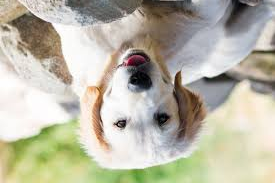

True

In [35]:
import numpy as np
import scipy
import cv2 as cv
from google.colab.patches import cv2_imshow

location = './train/dogs/dog_0.jpg'

img1 = cv.imread(location)

print(img1.shape)

if img1 is None:
  print('Image load failed!')

flip_down = np.flipud(img1)

cv2_imshow(flip_down)
cv.imwrite('./train/dogs/dog_5.jpg', flip_down)

In [36]:
import os

# 리스트로 만든 후 랜덤으로 뽑아서 augmentation을 진행하기 위함!
location = './train/dogs/'
image_list = os.listdir(location)
image_list # slicing 가능!

['dog_3.jpg',
 'dog_0.jpg',
 'dog_4.jpg',
 'dog_2.jpg',
 'dog_1.jpg',
 'dog_5.jpg',
 'dog_6.jpg',
 'dog_7.jpg',
 'dog_8.jpg',
 'dog_9.jpg']

In [37]:
# 랜덤으로 숫자를 뽑기
index = np.random.choice(len(image_list), 5)
print(index)

[8 2 3 8 1]


./train/dogs/dog_7.jpg


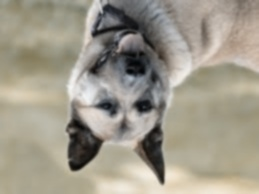

./train/dogs/dog_7.jpg


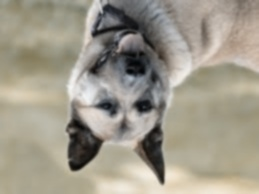

./train/dogs/dog_20.jpg


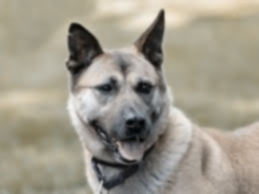

./train/dogs/dog_17.jpg


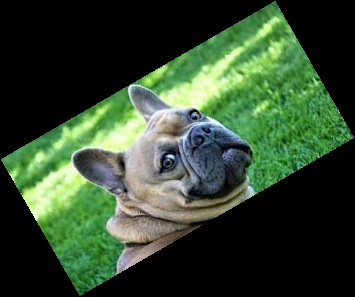

./train/dogs/dog_1.jpg


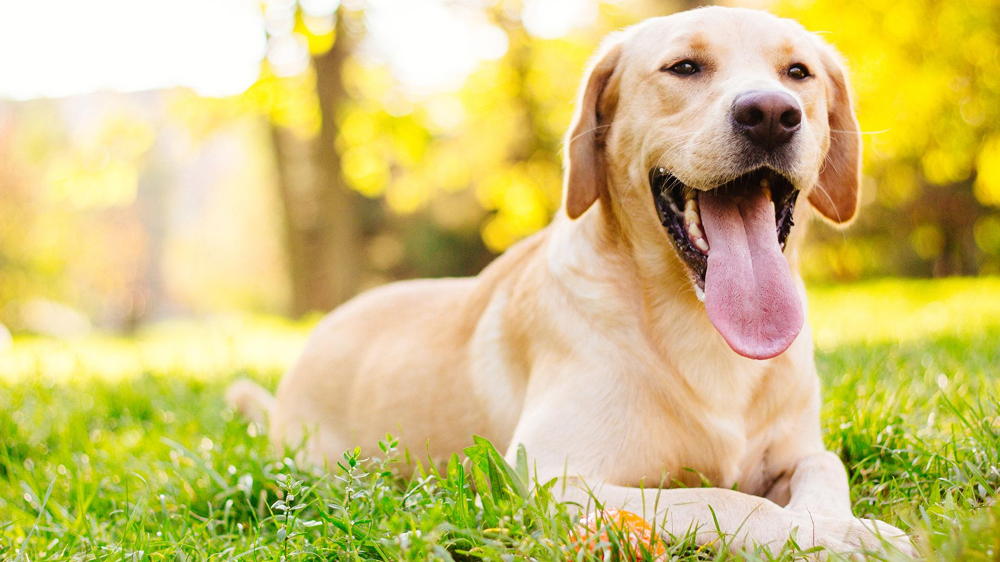

./train/dogs/dog_23.jpg


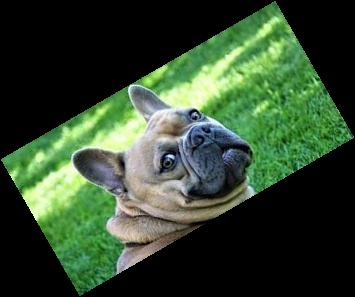

./train/dogs/dog_8.jpg


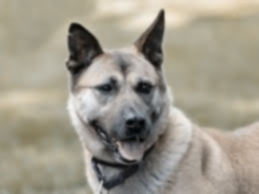

./train/dogs/dog_15.jpg


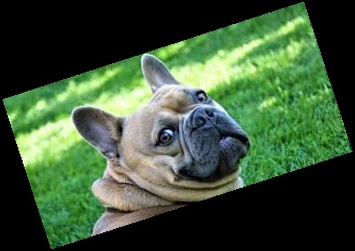

./train/dogs/dog_18.jpg


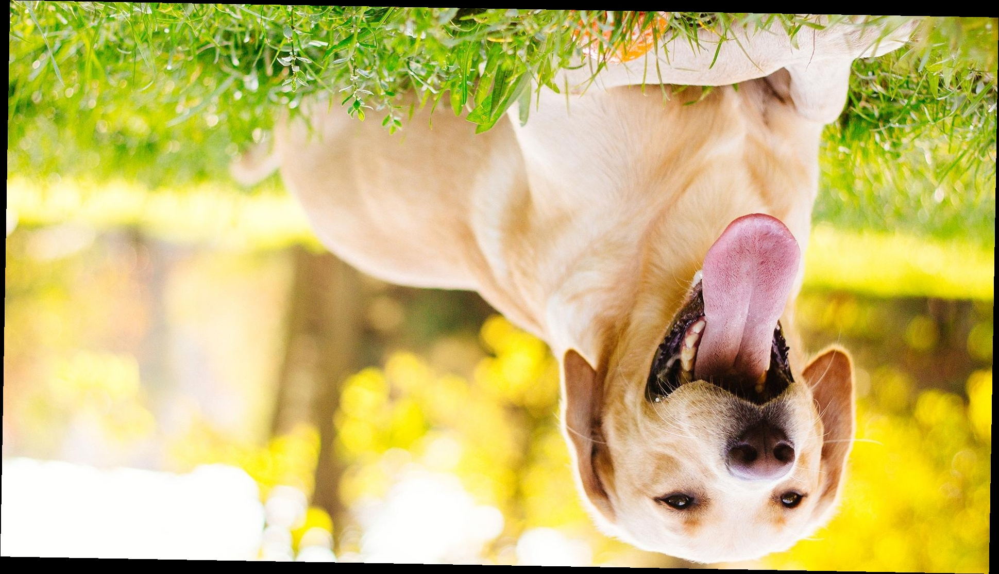

./train/dogs/dog_1.jpg


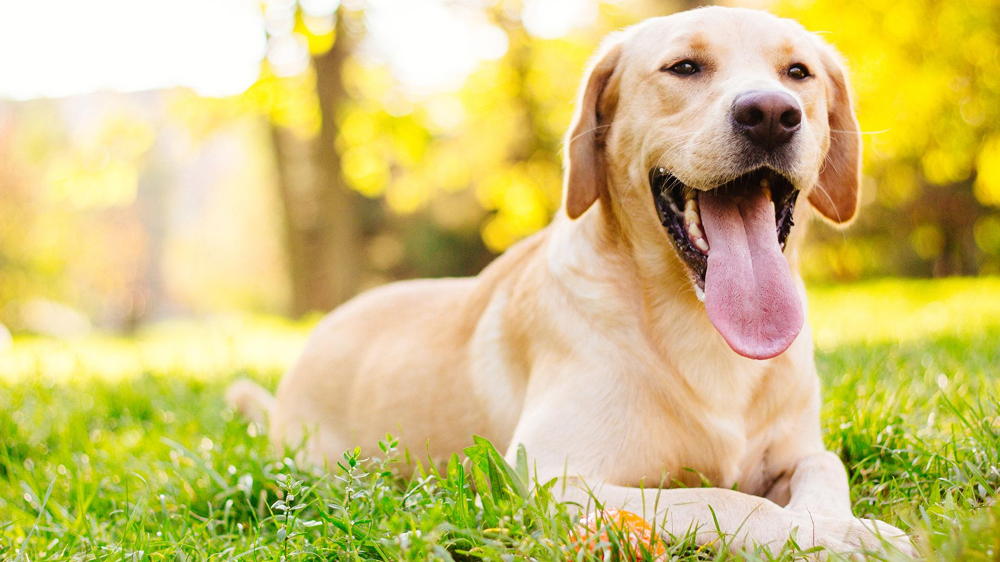

In [50]:
from scipy import ndimage # blurr image 생성

location = './train/dogs/'
image_list = os.listdir(location)

index = np.random.choice(len(image_list), 10)

count = 10
for i in index:
  
  location = './train/dogs/dog_{}.jpg'.format(i)
  print(location)
  
  image = cv.imread(location)
  
  # i값에 따른 다른 augmentation을 진행하도록 함
  if i % 2 == 0:
    image = np.flipud(image)
  elif i % 3 == 0:
    image = ndimage.rotate(image, np.random.choice(45, 1)[0])
  elif i % 5 == 0:
    image = ndimage.gaussian_filter(image, sigma=np.random.choice(5,1)[0])
    
  cv2_imshow(image)
  
  location = './train/dogs/dog_{}.jpg'.format((len(index) + count))
  cv.imwrite(location, image)
  count += 1

In [63]:
# fit : 데이터를 통채로 넘겨주고 batch size에 맞게 학습한다 ex) 100/20
# fit_generator : batch 단위로 데이터를 읽어들임, batch가 이미 생성되어 있음 -> 몇 덩이로 읽어야 하는지 알려줘야함 ex) 20 * 5
import os
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

# 일괄적으로 scaling 진행해줌
train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

base_dir = '/content/gdrive/My Drive/Colab Notebooks/koipa/augmentation'

train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')
test_dir = os.path.join(base_dir, 'test')

train_generator = train_datagen.flow_from_directory(
              train_dir,
              target_size = (224, 224),
              batch_size=20,
              class_mode = 'binary')

validation_generator = test_datagen.flow_from_directory(
              validation_dir,
              target_size = (224,224),
              batch_size = 20,
              class_mode = 'binary')

Found 60 images belonging to 2 classes.
Found 0 images belonging to 0 classes.


In [53]:
for data_batch, labels_batch in train_generator:
  print('Batch size :', data_batch.shape)
  print('Label size :', labels_batch.shape)
  break

Batch size : (20, 224, 224, 3)
Label size : (20,)


In [54]:
from keras.layers import Input, Dense, GlobalAveragePooling2D, Flatten
from keras.models import Model

from keras.applications.vgg16 import VGG16
from keras import layers
from keras import models

VGGNet = VGG16()

for layer in VGGNet.layers:
  layer.trainable = False
  
vgg_maxpool5 = VGGNet.get_layer('block5_pool').output

Feature_Flatten = Flatten()(vgg_maxpool5)
dense = Dense(10, name='dense', activation='relu')(Feature_Flatten)
predictions = Dense(1, activation='sigmoid')(dense)
New_VGGmodel = Model(inputs=VGGNet.input, outputs=predictions)
New_VGGmodel.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])

New_VGGmodel.summary()





553467904/553467096 [==============================] - 11s 0us/step



Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         (None, 224, 224, 3)       0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D) 

In [55]:
history = New_VGGmodel.fit_generator(
            train_generator,
            steps_per_epoch=10,
            epochs=30
)

Epoch 1/30
10/10 [==============================] - 9s 928ms/step - loss: 0.9551 - acc: 0.7500
Epoch 2/30
10/10 [==============================] - 4s 377ms/step - loss: 0.3678 - acc: 0.9800
Epoch 3/30
10/10 [==============================] - 4s 389ms/step - loss: 0.3685 - acc: 0.9700
Epoch 4/30
10/10 [==============================] - 4s 390ms/step - loss: 0.3393 - acc: 0.9950
Epoch 5/30
10/10 [==============================] - 4s 382ms/step - loss: 0.3590 - acc: 0.9950
Epoch 6/30
10/10 [==============================] - 4s 391ms/step - loss: 0.3228 - acc: 0.9950
Epoch 7/30
10/10 [==============================] - 4s 401ms/step - loss: 0.3373 - acc: 0.9950
Epoch 8/30
10/10 [==============================] - 4s 373ms/step - loss: 0.3364 - acc: 1.0000
Epoch 9/30
10/10 [==============================] - 4s 397ms/step - loss: 0.3174 - acc: 1.0000
Epoch 10/30
10/10 [==============================] - 4s 399ms/step - loss: 0.3435 - acc: 0.9950
Epoch 11/30
10/10 [==============================

In [0]:
New_VGGmodel.save('MyVGGNet.h5')